In [ ]:
# SHAP value analysis notebook
# Requires access to saved model files produced by the churn_model_fit_for_live_runs notebook

In [1]:
"""
Created on Wed Jun 19 11:48:32 2019

@author: Andrew Welsh

This notebook is for doing a model fit to the historical data, then save the fitted model via joblib. The data must 
be extracted via SQL prior to inclusion in this notebook (until a data connection directly to the database is configured),
then saved via CSV, which is read here. 

The parameter tuning for this model fit is accomplished with the churn_grid_search_parameter_tuning notebook

Intended use is production model re-fitting process every 6 months, as well as the initial model fit.

Output: saved model files
"""

import pandas as pd
import churn_common as c #imports F2 score function, model_fit function
import joblib

# imported data already has nulls cleaned and unused columns dropped
# churn_dedi_model_training_fit.csv is output from 'churn_dedi_model_training_fit.py' python script
churn_live = pd.read_csv('churn_dedi_model_live.csv', encoding='ISO-8859-1')

print('Query complete')
pd.options.display.max_columns = None

Query complete


In [2]:
#index column from CSV is imported as a separate column, labeled 'Unnamed: 0', therefore must be dropped before model fit
churn_live.drop(['Unnamed: 0'], axis=1, inplace=True)

#Model evaluation scores are determined by the "churn_grid_search_parameter_tuning" and 
#"churn_model_fit - feature selection engineering" notebooks
#therefore, we use the whole dataset for model fit.

In [3]:

#split the cleaned data from SQL into low, mid, high revenue band dataframes on values in average_invoiced_last_12_months column
churn_live_low, churn_live_mid, churn_live_hi = c.split_df_revenue_segments(churn_live, 'average_invoiced_last_12_months')

predictors_low = list(churn_live.columns[churn_live.columns.isin(c.dedi_model_fit_include_col_low)])
predictors_mid = list(churn_live.columns[churn_live.columns.isin(c.dedi_model_fit_include_col_mid)])
predictors_hi = list(churn_live.columns[churn_live.columns.isin(c.dedi_model_fit_include_col_hi)])

#create copy of the X and Y columns
x_live_low = churn_live_low[predictors_low] #uses list of columns excluding target (predictors) to select columns for x_live_low
y1_low = churn_live_low['target']

x_live_mid = churn_live_mid[predictors_mid]
y1_mid = churn_live_mid['target']

x_live_hi = churn_live_hi[predictors_hi]
y1_hi = churn_live_hi['target']

print("Loading fitted model")
xgb_final_low = joblib.load('churn_dedi_model_fit_low.sav')
xgb_final_mid = joblib.load('churn_dedi_model_fit_mid.sav')
xgb_final_hi  = joblib.load('churn_dedi_model_fit_hi.sav')
print("Fitted model loaded from saved files on disk")


Loading fitted model
Fitted model loaded from saved files on disk


/app/anaconda3/lib/python3.7/site-packages/sklearn/base.py:306: UserWarning: Trying to unpickle estimator LabelEncoder from version 0.20.0 when using version 0.21.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [4]:
#import libraries
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4

import time
import datetime
import xgboost as xgb
from xgboost.sklearn import XGBClassifier

In [5]:
#Generate dataframes with feature importances and their gain score. Can export to Excel (uncomment that code)

#Available importance_types = ['weight', 'gain', 'cover', 'total_gain', 'total_cover']
#'gain' is the average GINI gain for that feature when used in a split

fi_low_gain = pd.DataFrame(xgb_final_low.get_booster().get_score(importance_type= 'gain'),index=[0]) #have to specify index to satisfy conversion to dataframe
fi_low_gain = fi_low_gain.T #transpose result
fi_low_gain = fi_low_gain.sort_values([0], ascending=[True]).copy()

fi_mid_gain = pd.DataFrame(xgb_final_mid.get_booster().get_score(importance_type= 'gain'),index=[0]) #have to specify index to satisfy conversion to dataframe
fi_mid_gain = fi_mid_gain.T #transpose result
fi_mid_gain = fi_mid_gain.sort_values([0], ascending=[True]).copy()

fi_hi_gain = pd.DataFrame(xgb_final_hi.get_booster().get_score(importance_type= 'gain'),index=[0]) #have to specify index to satisfy conversion to dataframe
fi_hi_gain = fi_hi_gain.T #transpose result
fi_hi_gain = fi_hi_gain.sort_values([0], ascending=[True]).copy()

#Excel export for further analysis
#fi_low_gain.to_excel('1feat_imp_low.xlsx')
#fi_mid_gain.to_excel('1feat_imp_mid.xlsx')
#fi_hi_gain.to_excel('1feat_imp_hi.xlsx')


In [6]:
# create most recent feature importance plot for latest model : gbm_final_low, gbm_final_mid, gbm_final_hi
import matplotlib.pyplot as pyplot
from xgboost import plot_importance

rcParams['figure.figsize'] = 12, 12
fi_low = pd.concat([pd.DataFrame(predictors_low),pd.DataFrame(xgb_final_low.feature_importances_)], axis=1)
fi_low.columns=['features','feature importance']
fi_mid = pd.concat([pd.DataFrame(predictors_mid),pd.DataFrame(xgb_final_mid.feature_importances_)], axis=1)
fi_mid.columns=['features','feature importance']
fi_hi = pd.concat([pd.DataFrame(predictors_hi),pd.DataFrame(xgb_final_hi.feature_importances_)], axis=1)
fi_hi.columns=['features','feature importance']


# High Value Accounts
#print(fi_hi)
print(xgb_final_hi)

print('\nfeature importance chart - hi')
plot_importance(xgb_final_hi)
pyplot.show()
#print('feature importance chart- cover')
#plot_importance(xgb_final_hi, importance_type="cover")
pyplot.show()
print('feature importance chart- gain')
plot_importance(xgb_final_hi, importance_type="gain")
pyplot.show()

#Mid Value Accounts
#print(fi_mid)
print(xgb_final_mid)

print('\nfeature importance chart - mid')
plot_importance(xgb_final_mid)
pyplot.show()
#print('feature importance chart- cover')
#plot_importance(xgb_final_mid, importance_type="cover")
pyplot.show()
print('feature importance chart- gain')
plot_importance(xgb_final_mid, importance_type="gain")
pyplot.show()

#Low Value Accounts
#print(fi_low)
print(xgb_final_low)

import matplotlib.pyplot as pyplot

print('\nfeature importance chart - low')
plot_importance(xgb_final_low)
pyplot.show()
#print('feature importance chart- cover')
#plot_importance(xgb_final_low, importance_type="cover")
pyplot.show()
print('feature importance chart- gain')
plot_importance(xgb_final_low, importance_type="gain")
pyplot.show()

AttributeError: 'XGBClassifier' object has no attribute 'importance_type'

In [ ]:
#THIS CODE BLOCK DOESN'T WORK DUE TO LIMITATION OF LIBRARY
#from xgboost import plot_tree
#plot_tree(xgb_final_hi) #this feature won't work if white spaces are in the feature names.. which are in almost all of them

In [7]:
#==============================================================================================================
#==============================================================================================================
#==============================================================================================================
#Examine SHAP values for each of the models
#==============================================================================================================
#==============================================================================================================
#==============================================================================================================
#==============================================================================================================
import shap

#load JS Visualization code 
shap.initjs()


In [8]:
#Explain the Model's predictions using SHAP values
#High value Accounts
explainer_hi = shap.TreeExplainer(xgb_final_hi)
shap_values_hi = explainer_hi.shap_values(x_live_hi)

In [9]:
#Mid value Accounts
explainer_mid = shap.TreeExplainer(xgb_final_mid)
shap_values_mid = explainer_mid.shap_values(x_live_mid)

In [10]:
#Low value Accounts
explainer_low = shap.TreeExplainer(xgb_final_low)
shap_values_low = explainer_low.shap_values(x_live_low)

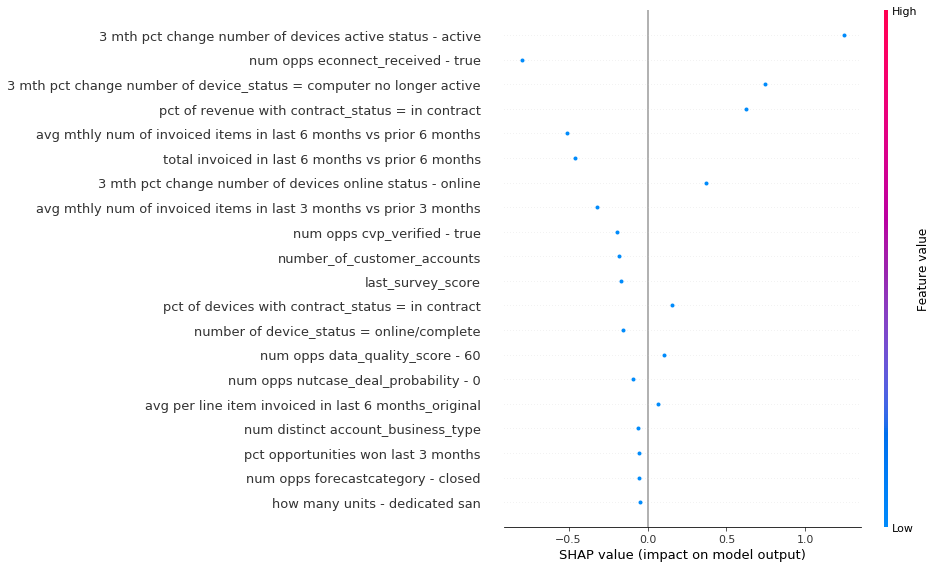

In [13]:
#shap.summary_plot(shap_values_hi, x_live_hi)
shap.summary_plot(shap_values_hi[idx,:], x_live_hi.iloc[idx,:])


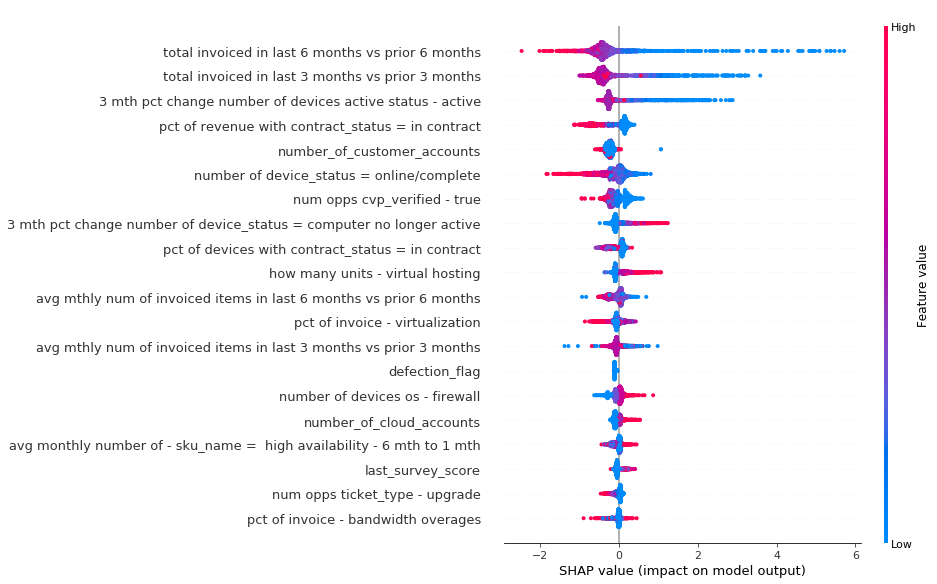

In [14]:
shap.summary_plot(shap_values_mid, x_live_mid)

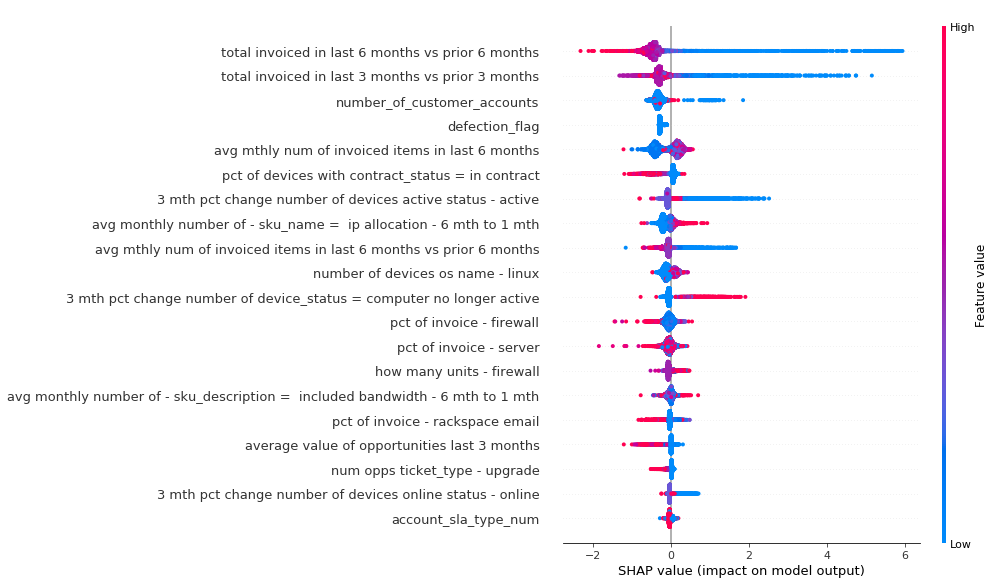

In [15]:
shap.summary_plot(shap_values_low, x_live_low)

In [11]:
#THIS BLOCK OF CODE WILL PRODUCE THE CHURN PREDICTION FOR A SPECIFIC ACCOUNT NUMBER
# ASSUMES LIVE RUN DATA WITH SINGLE TIME MONTH KEY (i.e. each account # is in dataset once), OTHERWISE SIZE MISMATCH ERROR

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
#shap.force_plot(explainer_hi.expected_value, shap_values_hi[0,:], x_eval_hi.iloc[0,:])
#shap.force_plot(explainer_hi.expected_value, shap_values_hi[1,:], x_eval_hi.iloc[1,:])

import numpy as np
#the x-values dataframe, x_eval_hi, does not have account number or TMK, so we need to re-concatenate these columns
#in order to do selection logic based on account number and TMK.
acct_nums_hi=pd.DataFrame(churn_live_hi[['account_number','time_month_key']])
x_hi_with_accts = pd.concat([acct_nums_hi,x_live_hi], axis=1)

acct_nums_mid=pd.DataFrame(churn_live_mid[['account_number','time_month_key']])
x_mid_with_accts = pd.concat([acct_nums_mid,x_live_mid], axis=1)

acct_nums_low=pd.DataFrame(churn_live_low[['account_number','time_month_key']])
x_low_with_accts = pd.concat([acct_nums_low,x_live_low], axis=1)

In [12]:
#INPUT ACCOUNT NUMBER HERE (NOTE: IT MUST BE IN REVENUE BAND YOU'RE PLOTTING)
acctn_hi_rev=167434
#create boolean array of rows where logic conditions are met (in this case, one row)
acct_ix_array = x_hi_with_accts.index[
    np.where(x_hi_with_accts['account_number']==acctn_hi_rev)]

#return index location of the model fit X value/predictors array- this is the row number we want to plot
idx = x_live_hi.index[acct_ix_array]

#pass this row number / array index to the force_plot so we can see what drives the specific prediction for that account
shap.force_plot(explainer_hi.expected_value, shap_values_hi[idx,:], x_live_hi.iloc[idx,:])

In [21]:
x_live_hi.iloc[idx,:]
#shap_values_hi[idx,:]

,pct of revenue with contract_status = in contract,defection_flag,num tickets ticket category - application,number of device_status = support maintenance,number_of_customer_accounts,pct of device_status = support maintenance,shortest active device tenure months,pct of devices with contract_status = in contract,3 mth pct change number of devices active status - active,3 mth pct change number of devices online status - online,avg monthly number of - sku_description = privatenet - 6 mth to 1 mth,total invoiced in last 6 months,total invoiced in last 6 months vs prior 6 months,avg mthly num of invoiced items in last 6 months vs prior 6 months,total invoiced in last 3 months vs prior 3 months,avg mthly num of invoiced items in last 3 months vs prior 3 months,per unit price - rpc core,per unit price - switch,per unit price - managed storage,per unit price - threat manager,how many units - managed exchange,how many units - rpc core,how many units - switch,how many units - managed storage,how many units - threat manager,how many units - bandwidth overages,pct of invoice - rpc core,pct of invoice - bandwidth overages,num opportunities last 6 months,num opportunities won last 6 months,pct opportunities won last 6 months,num opportunities won last 3 months,pct opportunities won last 3 months,average value of opportunities last 3 months,num opportunities,num opps category - upgrade,num opps category - new logo,num opps contract_length - 1,num opps contract_length - 0,num opps contract_length - 24,num opps cvp_verified - true,"num opps data_quality_description - missing: lead source, next ste",num opps data_quality_description - all opportunity details captur,num opps data_quality_description - missing: amount,num opps data_quality_score - 60,num opps econnect_received - false,num opps econnect_received - true,num opps focus_area - cloud office,num opps forecastcategory - closed,num opps forecastcategoryname - closed,num opps iswon - true,num opps leadsource - call in,num opps live_call - false,num opps market_source - yes,num opps on_demand_reconciled - false,num opps probability - 100,num opps support_unit - enterprise,num opps support_unit - email & apps,num opps typex - rackspace cloud,num opps why_did_we_lose - existing opp/closed via ticket,num distinct account_billing_postal_code,last_survey_score,second_last_survey_score
108,0.0,0,1,0,1.0,0.0,0.0,0.0,-0.313076,-0.313076,30.0,2820251.47,1.207654,1.25,0.968076,1.120418,0.0,783.448333,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,23.0,17.0,0.73913,7.0,0.538461,9572.131538,45.0,41.0,0.0,38.0,4.0,0.0,38.0,43.0,0.0,0.0,43.0,14.0,31.0,0.0,38.0,38.0,38.0,0.0,45.0,0.0,45.0,38.0,0.0,0.0,0.0,0.0,1,0,0


In [22]:
#INPUT ACCOUNT NUMBER HERE (NOTE: IT MUST BE IN REVENUE BAND YOU'RE PLOTTING)
acctn_mid_rev=853579
#create boolean array of rows where logic conditions are met (in this case, one row)
acct_ix_array = x_mid_with_accts.index[
    np.where(x_mid_with_accts['account_number']==acctn_mid_rev)]

#return index location of the model fit X value/predictors array- this is the row number we want to plot
idx = x_live_mid.index[acct_ix_array]

#pass this row number / array index to the force_plot so we can see what drives the specific prediction for that account
shap.force_plot(explainer_mid.expected_value, shap_values_mid[idx,:], x_live_mid.iloc[idx,:])

In [24]:
#INPUT ACCOUNT NUMBER HERE (NOTE: IT MUST BE IN REVENUE BAND YOU'RE PLOTTING)
acctn_low_rev=1000197
#create boolean array of rows where logic conditions are met (in this case, one row)
acct_ix_array = x_low_with_accts.index[
    np.where(x_low_with_accts['account_number']==acctn_low_rev)]

#return index location of the model fit X value/predictors array- this is the row number we want to plot
idx = x_live_low.index[acct_ix_array]

#pass this row number / array index to the force_plot so we can see what drives the specific prediction for that account
shap.force_plot(explainer_low.expected_value, shap_values_low[idx,:], x_live_low.iloc[idx,:])


Dependence plot- hi rev accounts


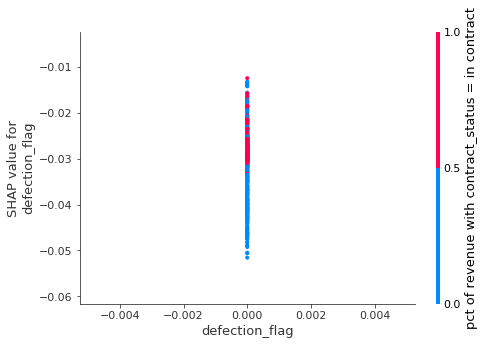


Dependence plot- mid rev accounts


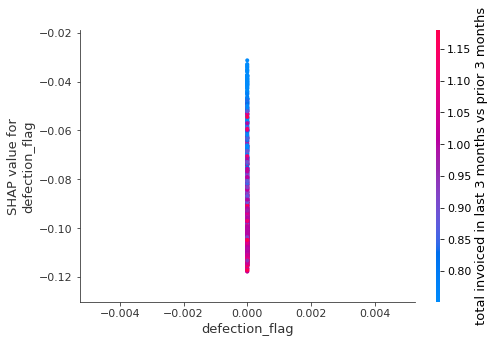


Dependence plot- low rev accounts


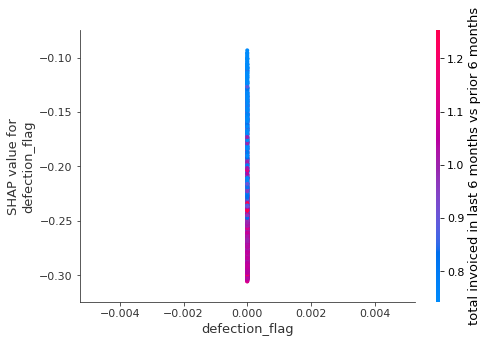

In [25]:
# SHAP interaction plots - the variable for the colored scale is automatically selected
base_col = "defection_flag"

print("\nDependence plot- hi rev accounts")
shap.dependence_plot(base_col, shap_values_hi, x_live_hi)
print("\nDependence plot- mid rev accounts")
shap.dependence_plot(base_col, shap_values_mid, x_live_mid)
print("\nDependence plot- low rev accounts")
shap.dependence_plot(base_col, shap_values_low, x_live_low)

In [27]:
# put SHAP values into dataframe
shap_values_hi_df = pd.DataFrame(shap_values_hi)
shap_values_hi_df.columns = [pd.Series(predictors_hi)]
# visualize the training set predictions
shap.force_plot(explainer_hi.expected_value, shap_values_hi, x_live_hi)

In [28]:
# visualize the training set predictions
shap.force_plot(explainer_mid.expected_value, shap_values_mid, x_live_mid)

In [ ]:
# visualize the training set predictions
#LOW REV HAS MANY ACCOUNTS- THIS VISUALIZATION IS VERY SLOW
shap.force_plot(explainer_low.expected_value, shap_values_low, x_live_low)

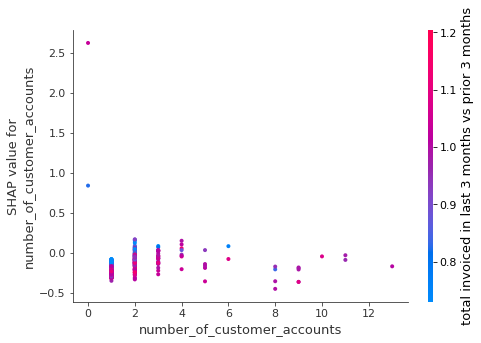

In [30]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("number_of_customer_accounts", shap_values_hi, x_live_hi)

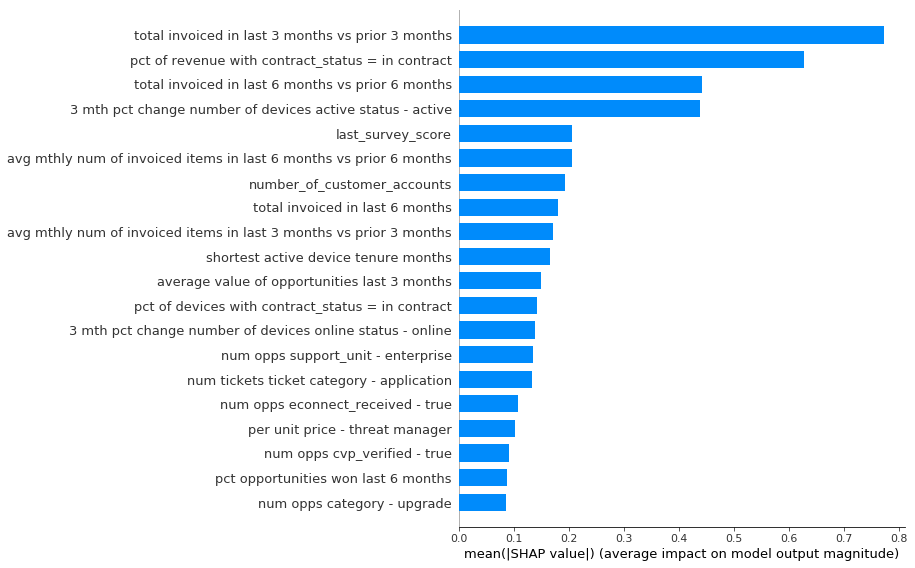

In [31]:
shap.summary_plot(shap_values_hi, x_live_hi, plot_type="bar")

In [33]:
#SHAP interactions matrix - takes a while to run!
interactions_hi = explainer_hi.shap_interaction_values(x_live_hi)

In [38]:
print(interactions_hi)

[[[ 7.89441347e-01 -5.32602705e-03 -1.85761005e-02 ...  7.82350078e-04
   -2.29029357e-03  3.68450116e-03]
  [-5.32534719e-03 -2.13826969e-02 -2.19840556e-04 ...  1.97989866e-05
   -2.39774585e-04 -1.18529424e-05]
  [-1.85759664e-02 -2.19864771e-04  8.89897719e-02 ...  4.97219153e-05
    2.03716755e-03  1.82166696e-05]
  ...
  [ 7.82191753e-04  1.97924674e-05  4.97242436e-05 ...  6.26837835e-03
    2.46521086e-04  5.34355640e-05]
  [-2.29008496e-03 -2.39860266e-04  2.03717221e-03 ...  2.46529933e-04
   -1.19208455e-01  1.75261591e-03]
  [ 3.68475914e-03 -1.18855387e-05  1.82194635e-05 ...  5.34434803e-05
    1.75262615e-03 -4.17075269e-02]]

 [[ 6.51623726e-01 -6.01769798e-03 -2.54900008e-02 ...  1.13250921e-04
   -7.79107213e-05  2.69453111e-03]
  [-6.01729751e-03 -2.22594254e-02  9.59038734e-05 ...  8.61915760e-06
   -2.09651887e-04 -2.29449943e-05]
  [-2.54904479e-02  9.59653407e-05  1.24744028e-01 ...  2.01286748e-05
    7.98037276e-03 -2.91643664e-05]
  ...
  [ 1.13293529e-04  8.6